In [ ]:
import os
os.getcwd()

'/Users/cccskye103/Desktop/Python_Final'

## 1. Data Analysis

In [ ]:
from pathlib import Path
import pandas as pd
import geopandas as gpd
import requests

BASE_DIR = Path(".").resolve()

DATA_DIR = BASE_DIR / "Data"
RAW_DIR = DATA_DIR / "raw"
PROCESSED_DIR = DATA_DIR / "processed"

print("Base directory:", BASE_DIR)
print("Raw directory:", RAW_DIR)

list(RAW_DIR.iterdir())

Base directory: /Users/cccskye103/Desktop/Python_Final
Raw directory: /Users/cccskye103/Desktop/Python_Final/Data/raw


[PosixPath('/Users/cccskye103/Desktop/Python_Final/Data/raw/Census_Block_Groups_2010.geojson'),
 PosixPath('/Users/cccskye103/Desktop/Python_Final/Data/raw/indego-trips-2023-q4.csv'),
 PosixPath('/Users/cccskye103/Desktop/Python_Final/Data/raw/indego-trips-2023-q3-2.csv'),
 PosixPath('/Users/cccskye103/Desktop/Python_Final/Data/raw/indego-trips-2023-q1.csv'),
 PosixPath('/Users/cccskye103/Desktop/Python_Final/Data/raw/indego-trips-2023-q2.csv')]

In [ ]:
bg_path = RAW_DIR / "Census_Block_Groups_2010.geojson"
print("Block group file exists:", bg_path.exists())

block_groups = gpd.read_file(bg_path)

print("Number of block groups:", len(block_groups))
print("CRS:", block_groups.crs)
block_groups.head()

Block group file exists: True
Number of block groups: 1336
CRS: EPSG:4326


,OBJECTID,STATEFP10,COUNTYFP10,TRACTCE10,BLKGRPCE10,GEOID10,NAMELSAD10,MTFCC10,FUNCSTAT10,ALAND10,AWATER10,INTPTLAT10,INTPTLON10,Shape__Area,Shape__Length,geometry
0,1,42,101,010800,1,421010108001,Block Group 1,G5030,S,161887,0,+39.9687580,-075.1997251,1.742508e+06,8200.327170,"POLYGON ((-75.19851 39.96945, -75.19744 39.969..."
1,2,42,101,010800,2,421010108002,Block Group 2,G5030,S,103778,0,+39.9665475,-075.2004455,1.117026e+06,4364.980144,"POLYGON ((-75.19783 39.96571, -75.20006 39.965..."
2,3,42,101,010900,2,421010109002,Block Group 2,G5030,S,43724,0,+39.9642929,-075.1896435,4.706347e+05,3048.109084,"POLYGON ((-75.18766 39.9645, -75.18755 39.9639..."
3,4,42,101,011000,2,421010110002,Block Group 2,G5030,S,108966,0,+39.9753585,-075.2113476,1.172871e+06,5169.004282,"POLYGON ((-75.20984 39.97351, -75.21221 39.973..."
4,5,42,101,011000,1,421010110001,Block Group 1,G5030,S,142244,0,+39.9724202,-075.2051689,1.531076e+06,10476.574129,"POLYGON ((-75.19855 39.9733, -75.19854 39.9730..."


In [ ]:
trip_files = sorted(RAW_DIR.glob("indego-trips-2023-q*.csv"))
trip_files

[PosixPath('/Users/cccskye103/Desktop/Python_Final/Data/raw/indego-trips-2023-q1.csv'),
 PosixPath('/Users/cccskye103/Desktop/Python_Final/Data/raw/indego-trips-2023-q2.csv'),
 PosixPath('/Users/cccskye103/Desktop/Python_Final/Data/raw/indego-trips-2023-q3-2.csv'),
 PosixPath('/Users/cccskye103/Desktop/Python_Final/Data/raw/indego-trips-2023-q4.csv')]

## 2. Data Inspection

In [5]:
trips_list = [pd.read_csv(f, low_memory=False) for f in trip_files]
trips = pd.concat(trips_list, ignore_index=True)

print("Trip rows:", len(trips))
trips.head()

Trip rows: 1084547


,trip_id,duration,start_time,end_time,start_station,start_lat,start_lon,end_station,end_lat,end_lon,bike_id,plan_duration,trip_route_category,passholder_type,bike_type
0,579507686,70,1/1/2023 0:00,1/1/2023 1:10,3063,39.946331,-75.169800,3063,39.946331,-75.169800,22584,365,Round Trip,Indego365,electric
1,579499091,17,1/1/2023 0:05,1/1/2023 0:22,3190,39.948921,-75.169907,3207,39.954411,-75.192001,5281,30,One Way,Indego30,standard
2,579499089,11,1/1/2023 0:06,1/1/2023 0:17,3182,39.950809,-75.169533,3102,39.967590,-75.179520,22366,30,One Way,Indego30,electric
3,579499087,1,1/1/2023 0:08,1/1/2023 0:09,3026,39.941818,-75.145500,3026,39.941818,-75.145500,17780,30,Round Trip,Indego30,electric
4,579499085,27,1/1/2023 0:09,1/1/2023 0:36,3046,39.950119,-75.144722,3112,39.953732,-75.218246,16897,30,One Way,Indego30,electric


In [6]:
stations_url = "https://bts-status.bicycletransit.workers.dev/phl"

response = requests.get(stations_url)
response.raise_for_status()

data = response.json()
features = data["features"]

stations_gdf = gpd.GeoDataFrame.from_features(features, crs="EPSG:4326")

print("Station rows:", len(stations_gdf))
stations_gdf.head()

Station rows: 290


,geometry,id,name,coordinates,totalDocks,docksAvailable,bikesAvailable,classicBikesAvailable,smartBikesAvailable,electricBikesAvailable,...,isEventBased,isVirtual,kioskId,notes,openTime,publicText,timeZone,trikesAvailable,latitude,longitude
0,POINT (-75.14403 39.94733),3005,"Welcome Park, NPS","[-75.14403, 39.94733]",13,1,11,5,0,6,...,False,False,3005,None,None,,None,0,39.94733,-75.14403
1,POINT (-75.20311 39.9522),3006,40th & Spruce,"[-75.20311, 39.9522]",17,17,0,0,0,0,...,False,False,3006,None,None,,None,0,39.95220,-75.20311
2,POINT (-75.15993 39.94517),3007,"11th & Pine, Kahn Park","[-75.15993, 39.94517]",20,16,3,2,0,1,...,False,False,3007,None,None,,None,0,39.94517,-75.15993
3,POINT (-75.15067 39.98081),3008,Temple University Station,"[-75.15067, 39.98081]",17,13,2,1,0,1,...,False,False,3008,None,None,,None,0,39.98081,-75.15067
4,POINT (-75.18982 39.95576),3009,33rd & Market,"[-75.18982, 39.95576]",14,10,4,4,0,0,...,False,False,3009,None,None,,None,0,39.95576,-75.18982


In [7]:
# Check current CRS
print("Block groups CRS:", block_groups.crs)
print("Stations CRS:", stations_gdf.crs)

# Use a projected CRS for Philly – Pennsylvania South feet
TARGET_CRS = "EPSG:2272"

bg_proj = block_groups.to_crs(TARGET_CRS)
stations_proj = stations_gdf.to_crs(TARGET_CRS)

print("Reprojected CRS (block groups):", bg_proj.crs)
print("Reprojected CRS (stations):", stations_proj.crs)

Block groups CRS: EPSG:4326
Stations CRS: EPSG:4326
Reprojected CRS (block groups): EPSG:2272
Reprojected CRS (stations): EPSG:2272


In [8]:
!pip install folium

In [86]:
import folium

bg_4326 = block_groups.to_crs("EPSG:4326")
stations_4326 = stations_gdf.to_crs("EPSG:4326")

# create map
m = folium.Map(
    location=[39.9526, -75.1652],
    zoom_start=12,
    tiles="CartoDB positron"
)

# block groups
folium.GeoJson(
    bg_4326,
    name="block_groups",
    style_function=lambda feature: {
        "fillColor": "#e0e0e0",
        "color": "#b0b0b0",
        "weight": 0.5,
        "fillOpacity": 0.15,
    },
).add_to(m)

# stations
for _, row in stations_4326.iterrows():
    folium.CircleMarker(
        location=[row.geometry.y, row.geometry.x],
        radius=4,
        color="#1f78b4",
        fill=True,
        fill_color="#1f78b4",
        fill_opacity=0.9,
    ).add_to(m)

# -------------------------------------------------------
# LEGEND (custom HTML)
# -------------------------------------------------------
legend_html = """
<div style="
    position: fixed; 
    bottom: 25px; left: 25px; width: 180px; 
    background: white; z-index: 9999; 
    padding: 10px; border: 2px solid #ccc; 
    font-size: 13px;
">
<b>Legend</b><br>
<span style="background:#e0e0e0; border:1px solid #b0b0b0; 
      width:14px; height:14px; display:inline-block;"></span>
&nbsp; Block Groups<br>

<span style="background:#1f78b4; border-radius:50%; 
      width:12px; height:12px; display:inline-block;"></span>
&nbsp; Bike Stations
</div>
"""

m.get_root().html.add_child(folium.Element(legend_html))

m



In [10]:
!pip install censusdata
import censusdata

In [11]:
# variables we want
acs_vars = [
    'B01003_001E',  # total population
    'B19013_001E',  # median income
    'B02001_002E',  # white
    'B02001_003E',  # black
    'B02001_005E',  # asian
    'B03003_003E',  # hispanic
    'B25044_003E',  # zero vehicle households
    'B08301_018E',  # bicycle commuters
]

# download ACS 2023 5-year block group data for Philadelphia County (FIPS: 42101)
acs_2023 = censusdata.download(
    'acs5', 
    2023, 
    censusdata.censusgeo([('state', '42'), ('county', '101'), ('block group', '*')]),
    acs_vars
)

acs_2023.head()


,B01003_001E,B19013_001E,B02001_002E,B02001_003E,B02001_005E,B03003_003E,B25044_003E,B08301_018E
"Block Group 1; Census Tract 1.01; Philadelphia County; Pennsylvania: Summary level: 150, state:42> county:101> tract:000101> block group:1",0,-666666666,0,0,0,0,0,0
"Block Group 2; Census Tract 1.01; Philadelphia County; Pennsylvania: Summary level: 150, state:42> county:101> tract:000101> block group:2",0,-666666666,0,0,0,0,0,0
"Block Group 3; Census Tract 1.01; Philadelphia County; Pennsylvania: Summary level: 150, state:42> county:101> tract:000101> block group:3",0,-666666666,0,0,0,0,0,0
"Block Group 4; Census Tract 1.01; Philadelphia County; Pennsylvania: Summary level: 150, state:42> county:101> tract:000101> block group:4",1138,107172,894,47,46,154,23,0
"Block Group 5; Census Tract 1.01; Philadelphia County; Pennsylvania: Summary level: 150, state:42> county:101> tract:000101> block group:5",858,122917,831,0,27,13,85,0


In [12]:
acs_2023['GEOID'] = acs_2023.index.to_series().apply(
    lambda x: x.geo[2][1] + x.geo[3][1]  # tract + block group codes
)

In [13]:
acs_2023.head()

,B01003_001E,B19013_001E,B02001_002E,B02001_003E,B02001_005E,B03003_003E,B25044_003E,B08301_018E,GEOID
"Block Group 1; Census Tract 1.01; Philadelphia County; Pennsylvania: Summary level: 150, state:42> county:101> tract:000101> block group:1",0,-666666666,0,0,0,0,0,0,0001011
"Block Group 2; Census Tract 1.01; Philadelphia County; Pennsylvania: Summary level: 150, state:42> county:101> tract:000101> block group:2",0,-666666666,0,0,0,0,0,0,0001012
"Block Group 3; Census Tract 1.01; Philadelphia County; Pennsylvania: Summary level: 150, state:42> county:101> tract:000101> block group:3",0,-666666666,0,0,0,0,0,0,0001013
"Block Group 4; Census Tract 1.01; Philadelphia County; Pennsylvania: Summary level: 150, state:42> county:101> tract:000101> block group:4",1138,107172,894,47,46,154,23,0,0001014
"Block Group 5; Census Tract 1.01; Philadelphia County; Pennsylvania: Summary level: 150, state:42> county:101> tract:000101> block group:5",858,122917,831,0,27,13,85,0,0001015


In [14]:
block_groups.columns

Index(['OBJECTID', 'STATEFP10', 'COUNTYFP10', 'TRACTCE10', 'BLKGRPCE10',
       'GEOID10', 'NAMELSAD10', 'MTFCC10', 'FUNCSTAT10', 'ALAND10', 'AWATER10',
       'INTPTLAT10', 'INTPTLON10', 'Shape__Area', 'Shape__Length', 'geometry'],
      dtype='object')

In [15]:
def make_geoid_full(x):
    # x.geo is a list of geography components:
    # [('state', '42'), ('county', '101'), ('tract', '000100'), ('block group', '1')]
    state = x.geo[0][1]      # '42'
    county = x.geo[1][1]     # '101'
    tract = x.geo[2][1]      # '000100'
    blkgrp = x.geo[3][1]     # '1'
    
    return state + county + tract + blkgrp

acs_2023['GEOID'] = acs_2023.index.to_series().apply(make_geoid_full)

In [16]:
acs_2023['GEOID'].head()

Block Group 1; Census Tract 1.01; Philadelphia County; Pennsylvania: Summary level: 150, state:42> county:101> tract:000101> block group:1    421010001011
Block Group 2; Census Tract 1.01; Philadelphia County; Pennsylvania: Summary level: 150, state:42> county:101> tract:000101> block group:2    421010001012
Block Group 3; Census Tract 1.01; Philadelphia County; Pennsylvania: Summary level: 150, state:42> county:101> tract:000101> block group:3    421010001013
Block Group 4; Census Tract 1.01; Philadelphia County; Pennsylvania: Summary level: 150, state:42> county:101> tract:000101> block group:4    421010001014
Block Group 5; Census Tract 1.01; Philadelphia County; Pennsylvania: Summary level: 150, state:42> county:101> tract:000101> block group:5    421010001015
Name: GEOID, dtype: object

In [17]:
block_groups = block_groups.rename(columns={'GEOID10': 'GEOID'})

In [18]:
block_groups_acs = block_groups.merge(
    acs_2023,
    on='GEOID',
    how='left'
)

In [19]:
block_groups_acs = block_groups_acs.replace(
    [-666666666, -666666667, -222222222],
    pd.NA
)

In [20]:
block_groups_acs[['B01003_001E', 'B19013_001E', 'B02001_003E']].describe()

,B01003_001E,B02001_003E
count,1151.000000,1151.000000
mean,1248.841008,522.159861
std,650.884279,525.509607
min,0.000000,0.000000
25%,789.000000,102.000000
50%,1120.000000,385.000000
75%,1605.000000,792.000000
max,4265.000000,3684.000000


In [21]:
bg_proj['centroid'] = bg_proj.geometry.centroid
bg_centroids = bg_proj.set_geometry('centroid')

In [22]:
nearest = bg_centroids.sjoin_nearest(
    stations_proj[['geometry']],
    how='left',
    distance_col='dist_to_station_ft'
)

In [23]:
bg_proj['dist_to_station_ft'] = nearest['dist_to_station_ft'].values

In [24]:
bg_proj['dist_to_station_ft'].describe()

count     1336.000000
mean     10318.505472
std      12921.454684
min          0.701145
25%        918.895354
50%       3654.985911
75%      16798.387059
max      59632.188947
Name: dist_to_station_ft, dtype: float64

In [36]:
bg_proj = bg_proj.to_crs("EPSG:2272")
stations_proj = stations_gdf.to_crs("EPSG:2272")

bg_proj['centroid'] = bg_proj.geometry.centroid
bg_centroids = bg_proj.set_geometry('centroid')

buffer_400m = 400 * 3.28084
buffer_800m = 800 * 3.28084

bg_centroids['buffer_400m'] = bg_centroids.buffer(buffer_400m)
bg_centroids['buffer_800m'] = bg_centroids.buffer(buffer_800m)    # Compute 400m & 800m buffers

In [37]:
stations_points = stations_proj[['geometry']].copy()

In [38]:
bg_400 = gpd.sjoin(
    bg_centroids.set_geometry('buffer_400m'),
    stations_points,
    how='left',
    predicate='contains'
)

count_400 = bg_400.groupby(bg_400.index).size().rename('stations_within_400m')

In [39]:
bg_800 = gpd.sjoin(
    bg_centroids.set_geometry('buffer_800m'),
    stations_points,
    how='left',
    predicate='contains'
)

count_800 = bg_800.groupby(bg_800.index).size().rename('stations_within_800m')

In [40]:
bg_proj['stations_within_400m'] = count_400.reindex(bg_proj.index).fillna(0)
bg_proj['stations_within_800m'] = count_800.reindex(bg_proj.index).fillna(0)

In [41]:
bg_proj[['stations_within_400m', 'stations_within_800m']].describe()

,stations_within_400m,stations_within_800m
count,1336.000000,1336.000000
mean,1.413922,3.459581
std,1.082410,4.518776
min,1.000000,1.000000
25%,1.000000,1.000000
50%,1.000000,1.000000
75%,1.000000,4.000000
max,10.000000,31.000000


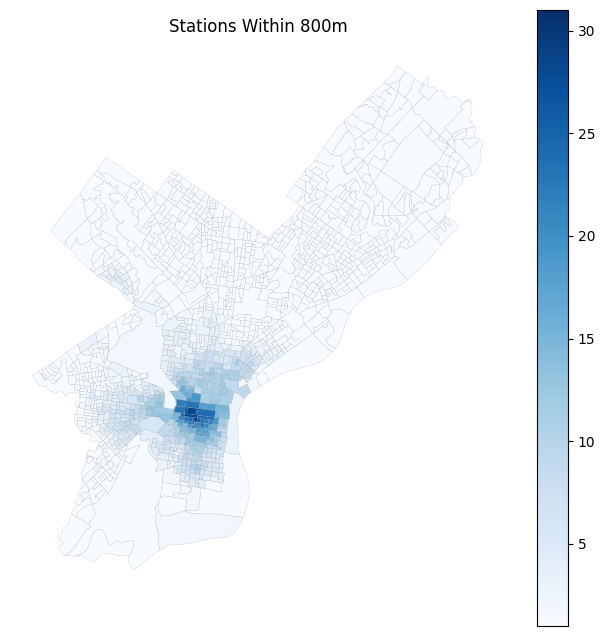

In [43]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(8,8))
bg_proj.plot(
    column='stations_within_800m',
    ax=ax,
    legend=True,
    cmap='Blues',
    linewidth=0.1,
    edgecolor='grey'
)
ax.set_title("Stations Within 800m")
ax.set_axis_off()
plt.show()


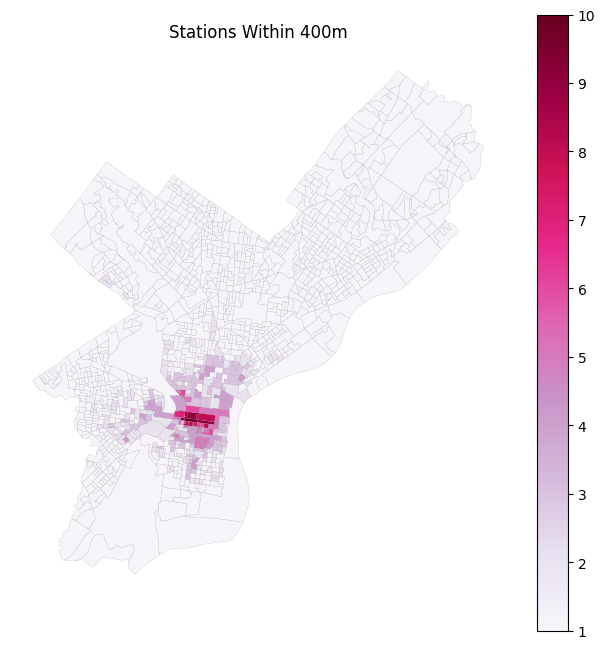

In [111]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(8,8))

bg_proj.plot(
    column='stations_within_400m',
    ax=ax,
    legend=True,
    cmap='PuRd',          # ← warm orange-red
    linewidth=0.1,
    edgecolor='grey'
)

ax.set_title("Stations Within 400m")
ax.set_axis_off()

plt.show()



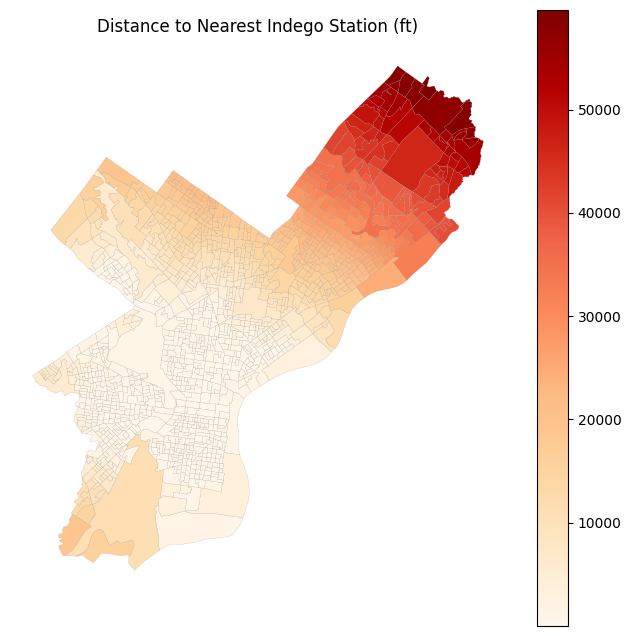

In [44]:
fig, ax = plt.subplots(figsize=(8,8))
bg_proj.plot(
    column='dist_to_station_ft',
    ax=ax,
    legend=True,
    cmap='OrRd',
    linewidth=0.1,
    edgecolor='grey'
)
ax.set_title("Distance to Nearest Indego Station (ft)")
ax.set_axis_off()
plt.show()


In [45]:
!pip install osmnx

In [100]:
import osmnx as ox
import geopandas as gpd

# 让 osmnx 使用缓存（更快）
ox.settings.use_cache = True
ox.settings.log_console = True

# 定义你想抓的区域 —— 用 city name 最简单
place = "Philadelphia, Pennsylvania, USA"

# 抓取只包含“骑行可通行”的道路 (highway in cycleway/bike priority)
G = ox.graph_from_place(place, network_type='bike')

# 转成 GeoDataFrame
bike_edges = ox.graph_to_gdfs(G, nodes=False, edges=True)

# 投影成与分析一致的坐标系 (feet)
bike_edges = bike_edges.to_crs(2272)

bike_edges.head()


osmid      highway               name  oneway  \
u         v         key                                                      
109726936 109726940 0     12108955  residential     Brunner Street    True   
          109992543 0     43226669      primary  Germantown Avenue   False   
          109992535 0     43226669      primary  Germantown Avenue   False   
109726940 109726950 0    302956448  residential       Wayne Avenue   False   
          110047495 0    302956448  residential       Wayne Avenue   False   

                        reversed      length lanes maxspeed       service  \
u         v         key                                                     
109726936 109726940 0      False  174.382306   NaN      NaN           NaN   
          109992543 0      False   55.073821     2   25 mph  disused_tram   
          109992535 0       True    7.177834     2   25 mph  disused_tram   
109726940 109726950 0      False   11.447633   NaN      NaN           NaN   
          110047495 0       True   34.627130   NaN      NaN           NaN   

                                                                  geometry  \
u         v         key                                                      
109726936 109726940 0    LINESTRING (2695094.618 260318.14, 2694612.512...   
          109992543 0    LINESTRING (2695094.618 260318.14, 2695013.384...   
          109992535 0    LINESTRING (2695094.618 260318.14, 2695105.597...   
109726940 109726950 0    LINESTRING (2694612.512 260008.562, 2694632.74...   
          110047495 0    LINESTRING (2694612.512 260008.562, 2694551.30...   

                        access  ref bridge width tunnel junction area  
u         v         key                                                
109726936 109726940 0      NaN  NaN    NaN   NaN    NaN      NaN  NaN  
          109992543 0      NaN  NaN    NaN   NaN    NaN      NaN  NaN  
          109992535 0      NaN  NaN    NaN   NaN    NaN      NaN  NaN  
109726940 109726950 0      NaN  NaN    NaN   NaN    NaN      NaN  NaN  
          110047495 0      NaN  NaN    NaN   NaN    NaN      NaN  NaN

In [56]:
# nearest bike lane for each centroid (you already ran this)
nearest_bike = bg_centroids.sjoin_nearest(
    bike_edges,
    how='left',
    distance_col='dist_to_bikelane_ft'
)

# 1. take the MIN distance per block group (group by index)
dist_to_bike = nearest_bike.groupby(nearest_bike.index)['dist_to_bikelane_ft'].min()

# 2. align back to bg_proj by index
bg_proj['dist_to_bikelane_ft'] = dist_to_bike.reindex(bg_proj.index)

# 3. convert to meters
bg_proj['dist_to_bikelane_m'] = bg_proj['dist_to_bikelane_ft'] * 0.3048

bg_proj['dist_to_bikelane_ft'].describe()


count    1336.000000
mean       49.287174
std        80.870854
min         0.040906
25%         9.850038
50%        28.640869
75%        60.698483
max      1592.880493
Name: dist_to_bikelane_ft, dtype: float64

In [57]:
bg_proj = block_groups_acs.to_crs("EPSG:2272").copy()

bg_proj.columns

Index(['OBJECTID', 'STATEFP10', 'COUNTYFP10', 'TRACTCE10', 'BLKGRPCE10',
       'GEOID', 'NAMELSAD10', 'MTFCC10', 'FUNCSTAT10', 'ALAND10', 'AWATER10',
       'INTPTLAT10', 'INTPTLON10', 'Shape__Area', 'Shape__Length', 'geometry',
       'B01003_001E', 'B19013_001E', 'B02001_002E', 'B02001_003E',
       'B02001_005E', 'B03003_003E', 'B25044_003E', 'B08301_018E'],
      dtype='object')

In [58]:
import pandas as pd
import numpy as np

def minmax(series):
    # convert to numeric, turn bad values into NaN
    s = pd.to_numeric(series, errors="coerce")
    s_min = s.min()
    s_max = s.max()
    return (s - s_min) / (s_max - s_min)

In [59]:
# total population
pop = pd.to_numeric(bg_proj['B01003_001E'], errors='coerce')

# race: white + nonwhite share
white = pd.to_numeric(bg_proj['B02001_002E'], errors='coerce')
pct_nonwhite = 1 - (white / pop.replace(0, np.nan))

# income
median_income = pd.to_numeric(bg_proj['B19013_001E'], errors='coerce')

# zero-vehicle households
zero_vehicle = pd.to_numeric(bg_proj['B25044_003E'], errors='coerce').fillna(0)

# scaled need components (0–1, 1 = higher need)
# income: higher need = lower income → invert after scaling
income_scaled = minmax(median_income)
need_income = 1 - income_scaled

need_nonwhite = minmax(pct_nonwhite)
need_zero_vehicle = minmax(zero_vehicle)

# combined need score
bg_proj['need_score'] = (need_income + need_nonwhite + need_zero_vehicle) / 3

bg_proj['need_score'].describe()


count    912.000000
mean       0.492663
std        0.148497
min        0.051067
25%        0.371835
50%        0.515928
75%        0.611262
max        0.956303
Name: need_score, dtype: float64

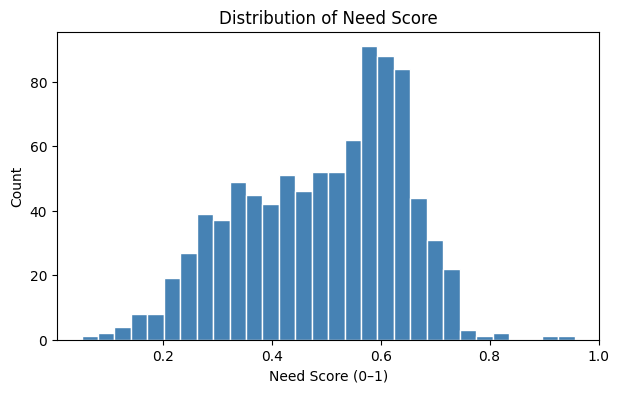

In [60]:
plt.figure(figsize=(7,4))
bg_proj['need_score'].plot.hist(bins=30, color='steelblue', edgecolor='white')
plt.title("Distribution of Need Score")
plt.xlabel("Need Score (0–1)")
plt.ylabel("Count")
plt.show()

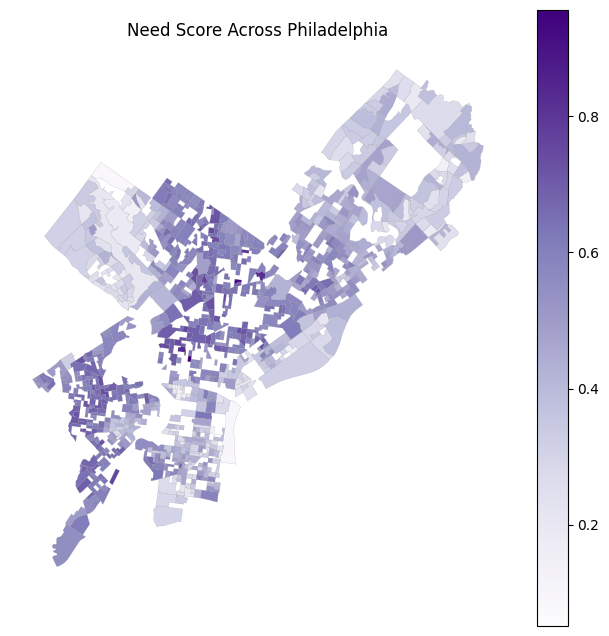

In [61]:
fig, ax = plt.subplots(figsize=(8,8))
bg_proj.plot(
    column='need_score',
    ax=ax,
    legend=True,
    cmap='Purples',
    linewidth=0.1,
    edgecolor='grey'
)
ax.set_title("Need Score Across Philadelphia")
ax.set_axis_off()
plt.show()

In [62]:
# make sure everything is in the projected CRS
bg_proj = bg_proj.to_crs("EPSG:2272").copy()
stations_proj = stations_gdf.to_crs("EPSG:2272").copy()

# centroids
bg_proj["centroid"] = bg_proj.geometry.centroid
bg_centroids = bg_proj.set_geometry("centroid")

# ---------- distance to nearest station ----------
nearest_station = bg_centroids.sjoin_nearest(
    stations_proj[["geometry"]],
    how="left",
    distance_col="dist_to_station_ft"
)

# take MIN distance per BG (group by index)
dist_to_station = nearest_station.groupby(nearest_station.index)["dist_to_station_ft"].min()
bg_proj["dist_to_station_ft"] = dist_to_station.reindex(bg_proj.index)

# ---------- station counts within 400m / 800m ----------
buffer_400 = 400 * 3.28084   # m → ft
buffer_800 = 800 * 3.28084

bg_centroids["buffer_400m"] = bg_centroids.buffer(buffer_400)
bg_centroids["buffer_800m"] = bg_centroids.buffer(buffer_800)

stations_points = stations_proj[["geometry"]].copy()

# 400m
bg_400 = gpd.sjoin(
    bg_centroids.set_geometry("buffer_400m"),
    stations_points,
    how="left",
    predicate="contains"
)
count_400 = bg_400.groupby(bg_400.index).size()

# 800m
bg_800 = gpd.sjoin(
    bg_centroids.set_geometry("buffer_800m"),
    stations_points,
    how="left",
    predicate="contains"
)
count_800 = bg_800.groupby(bg_800.index).size()

bg_proj["stations_within_400m"] = count_400.reindex(bg_proj.index).fillna(0)
bg_proj["stations_within_800m"] = count_800.reindex(bg_proj.index).fillna(0)

# ---------- distance to nearest bike lane (if you already have edges) ----------
# (skip this block if you haven't built `edges` with osmnx yet)
try:
    bike_edges = edges[["geometry"]].copy()

    nearest_bike = bg_centroids.sjoin_nearest(
        bike_edges,
        how="left",
        distance_col="dist_to_bikelane_ft"
    )

    dist_to_bike = nearest_bike.groupby(nearest_bike.index)["dist_to_bikelane_ft"].min()
    bg_proj["dist_to_bikelane_ft"] = dist_to_bike.reindex(bg_proj.index)
except NameError:
    print("No `edges` bike network yet – skipping bike-lane distance.")



In [63]:
bg_proj[["stations_within_800m", "dist_to_station_ft"]].head()

,stations_within_800m,dist_to_station_ft
0,4,1696.105745
1,5,913.283763
2,6,1059.242742
3,2,1028.181373
4,2,2217.695798


In [64]:
stations800 = pd.to_numeric(bg_proj["stations_within_800m"], errors="coerce")
dist_station = pd.to_numeric(bg_proj["dist_to_station_ft"], errors="coerce")
dist_bikelane = pd.to_numeric(bg_proj["dist_to_bikelane_ft"], errors="coerce")

acc_stations800 = minmax(stations800)
acc_dist_station = minmax(-dist_station)      # closer = better = bigger value
acc_dist_bikelane = minmax(-dist_bikelane)    # closer = better

bg_proj["access_score"] = (acc_stations800 + acc_dist_station + acc_dist_bikelane) / 3
bg_proj["access_score"].describe()


count    1336.000000
mean        0.626014
std         0.107260
min         0.257061
25%         0.561131
50%         0.635703
75%         0.691031
max         0.984606
Name: access_score, dtype: float64

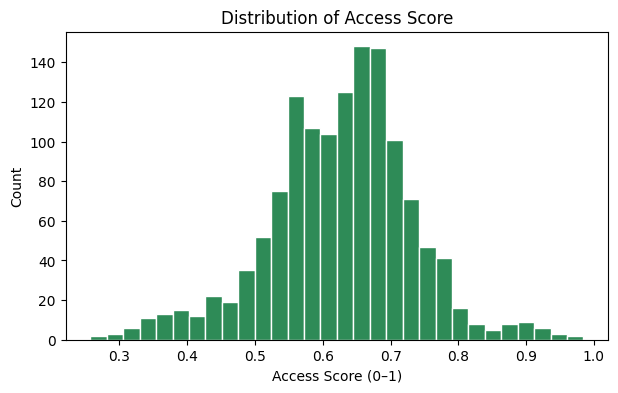

In [65]:
plt.figure(figsize=(7,4))
bg_proj['access_score'].plot.hist(bins=30, color='seagreen', edgecolor='white')
plt.title("Distribution of Access Score")
plt.xlabel("Access Score (0–1)")
plt.ylabel("Count")
plt.show()

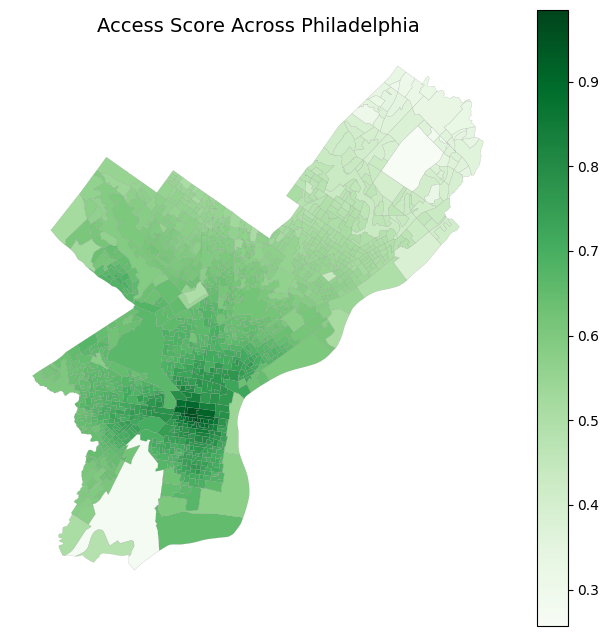

In [66]:
fig, ax = plt.subplots(figsize=(8,8))

bg_proj.plot(
    column='access_score',
    ax=ax,
    legend=True,
    cmap='Greens',
    linewidth=0.1,
    edgecolor='grey'
)

ax.set_title("Access Score Across Philadelphia", fontsize=14)
ax.set_axis_off()

plt.show()

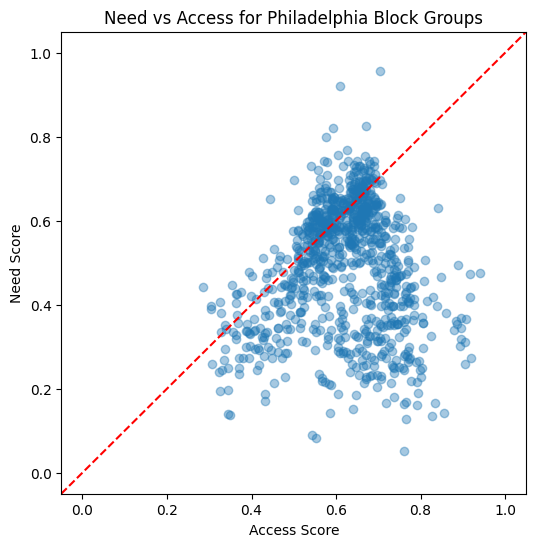

In [67]:
plt.figure(figsize=(6,6))
plt.scatter(bg_proj['access_score'], bg_proj['need_score'], alpha=0.4)
plt.xlabel("Access Score")
plt.ylabel("Need Score")
plt.title("Need vs Access for Philadelphia Block Groups")
plt.axline((0,0),(1,1), color='red', linestyle='--')
plt.show()

In [68]:
bg_proj["equity_gap"] = bg_proj["need_score"] - bg_proj["access_score"]
bg_proj["equity_gap"].describe()

count    912.000000
mean      -0.127183
std        0.180849
min       -0.713378
25%       -0.248470
50%       -0.067707
75%        0.006950
max        0.311099
Name: equity_gap, dtype: float64

In [69]:
import pandas as pd

bg_proj['equity_gap_q'] = pd.qcut(
    bg_proj['equity_gap'],
    q=4,
    labels=['Lowest gap', 'Low–medium', 'Medium–high', 'Highest gap']
)

bg_proj['equity_gap_q'].value_counts()

equity_gap_q
Lowest gap     228
Low–medium     228
Medium–high    228
Highest gap    228
Name: count, dtype: int64

In [70]:
import folium

# convert BG data to EPSG:4326
bg_4326 = bg_proj.to_crs("EPSG:4326").copy()

color_map = {
    'Lowest gap': '#2166ac',
    'Low–medium': '#67a9cf',
    'Medium–high': '#fddbc7',
    'Highest gap': '#b2182b'
}

m = folium.Map(location=[39.9526, -75.1652], zoom_start=11, tiles='CartoDB positron')

def style_func(feature):
    cat = feature['properties']['equity_gap_q']
    return {
        'fillColor': color_map.get(cat, '#cccccc'),
        'color': '#555555',
        'weight': 0.3,
        'fillOpacity': 0.7,
    }

folium.GeoJson(
    bg_4326[['GEOID', 'equity_gap', 'equity_gap_q', 'geometry']],
    style_function=style_func,
    tooltip=folium.GeoJsonTooltip(
        fields=['GEOID', 'equity_gap', 'equity_gap_q'],
        aliases=['GEOID', 'Equity gap', 'Category'],
        localize=True
    )
).add_to(m)

# ---- Add Legend ----
legend_html = """
<div style="
    position: fixed; 
    bottom: 30px; left: 30px; width: 200px; 
    border:2px solid grey; z-index:9999; font-size:14px;
    background-color:white; padding: 10px;
">
<b>Equity Gap Legend</b><br>
&nbsp;<i style="background:#b2182b;width:12px;height:12px;float:left;margin-right:5px"></i> Highest gap<br>
&nbsp;<i style="background:#fddbc7;width:12px;height:12px;float:left;margin-right:5px"></i> Medium–high<br>
&nbsp;<i style="background:#67a9cf;width:12px;height:12px;float:left;margin-right:5px"></i> Low–medium<br>
&nbsp;<i style="background:#2166ac;width:12px;height:12px;float:left;margin-right:5px"></i> Lowest gap<br>
</div>
"""

m.get_root().html.add_child(folium.Element(legend_html))

m


In [84]:
import folium
import branca

# 1. 把 block group 投到 WGS84，只保留需要的列
bg_4326 = bg_proj.to_crs(4326).copy()
bg_4326 = bg_4326[[
    "GEOID",
    "need_score",
    "access_score",
    "equity_gap",
    "equity_gap_q",
    "geometry",
]].dropna(subset=["need_score", "access_score", "equity_gap"])

# 2. station 也转成 WGS84
stations_4326 = stations_gdf.to_crs(4326).copy()

# 3. 建一个以 Philly 为中心的底图
m = folium.Map(
    location=[39.9526, -75.1652],
    zoom_start=11,
    tiles="CartoDB positron"
)

# ---------------------------------------------------------
# 1) NEED SCORE LAYER
# ---------------------------------------------------------
need_cmap = branca.colormap.linear.Purples_09.scale(
    bg_4326["need_score"].min(),
    bg_4326["need_score"].max()
)

def style_need(feature):
    val = feature["properties"].get("need_score")
    return {
        "fillColor": need_cmap(val) if val is not None else "#cccccc",
        "color": "#555555",
        "weight": 0.2,
        "fillOpacity": 0.7,
    }

need_layer = folium.FeatureGroup(name="Need score", show=True)

folium.GeoJson(
    data=bg_4326[["GEOID", "need_score", "geometry"]],
    style_function=style_need,
    tooltip=folium.GeoJsonTooltip(
        fields=["GEOID", "need_score"],
        aliases=["GEOID", "Need score"],
        localize=True,
    ),
).add_to(need_layer)

need_layer.add_to(m)

# ---------------------------------------------------------
# 2) ACCESS SCORE LAYER
# ---------------------------------------------------------
acc_cmap = branca.colormap.linear.Greens_09.scale(
    bg_4326["access_score"].min(),
    bg_4326["access_score"].max()
)

def style_access(feature):
    val = feature["properties"].get("access_score")
    return {
        "fillColor": acc_cmap(val) if val is not None else "#cccccc",
        "color": "#555555",
        "weight": 0.2,
        "fillOpacity": 0.7,
    }

access_layer = folium.FeatureGroup(name="Access score", show=False)

folium.GeoJson(
    data=bg_4326[["GEOID", "access_score", "geometry"]],
    style_function=style_access,
    tooltip=folium.GeoJsonTooltip(
        fields=["GEOID", "access_score"],
        aliases=["GEOID", "Access score"],
        localize=True,
    ),
).add_to(access_layer)

access_layer.add_to(m)

# ---------------------------------------------------------
# 3) EQUITY GAP LAYER  (need_score - access_score)
# ---------------------------------------------------------
gap_cmap = branca.colormap.linear.RdYlBu_11.scale(
    bg_4326["equity_gap"].min(),
    bg_4326["equity_gap"].max()
)

def style_gap(feature):
    val = feature["properties"].get("equity_gap")
    return {
        "fillColor": gap_cmap(val) if val is not None else "#cccccc",
        "color": "#555555",
        "weight": 0.2,
        "fillOpacity": 0.7,
    }

gap_layer = folium.FeatureGroup(name="Equity gap (need − access)", show=False)

folium.GeoJson(
    data=bg_4326[["GEOID", "equity_gap", "equity_gap_q", "geometry"]],
    style_function=style_gap,
    tooltip=folium.GeoJsonTooltip(
        fields=["GEOID", "equity_gap", "equity_gap_q"],
        aliases=["GEOID", "Equity gap", "Gap category"],
        localize=True,
    ),
).add_to(gap_layer)

gap_layer.add_to(m)

# ---------------------------------------------------------
# 4) STATIONS LAYER
# ---------------------------------------------------------
stations_layer = folium.FeatureGroup(name="Indego stations", show=True)

for _, row in stations_4326.iterrows():
    folium.CircleMarker(
        location=[row.geometry.y, row.geometry.x],
        radius=3,
        fill=True,
        fill_opacity=0.9,
        weight=0,
    ).add_to(stations_layer)

stations_layer.add_to(m)

# ---------------------------------------------------------
# 5) LAYER CONTROL + TEXT LEGEND
# ---------------------------------------------------------
folium.LayerControl(collapsed=False).add_to(m)

legend_html = """
<div style="
    position: fixed;
    bottom: 30px; left: 30px; width: 260px;
    border:2px solid grey; z-index:9999; font-size:13px;
    background-color:white; padding: 10px;
">
<b>Map layers</b><br>
Need score: darker purple = higher social need.<br>
Access score: darker green = better bike and station access.<br>
Equity gap: red = lower need and/or better access; blue = higher need with lower access.<br>
Use the layer control (top right) to switch between layers.
</div>
"""
m.get_root().html.add_child(folium.Element(legend_html))

m


In [107]:
import folium

# 1. 转成 WGS84，并且只保留需要的列
bg_4326 = bg_proj.to_crs(4326).copy()

bg_4326 = bg_4326[[
    "GEOID",
    "need_score",
    "access_score",
    "equity_gap",
    "B19013_001E",          # median income
    "stations_within_800m",
    "geometry"
]].dropna(subset=["equity_gap"])

# 2. 选 equity_gap 最大的前 5 个 block group
top5 = bg_4326.sort_values("equity_gap", ascending=False).head(5).copy()
top5["priority_rank"] = range(1, len(top5) + 1)

# 给每个 rank 一个颜色
rank_colors = {
    1: "#d73027",  # 深红
    2: "#fc8d59",  # 橙红
    3: "#fee08b",  # 浅黄
    4: "#91bfdb",  # 浅蓝
    5: "#4575b4",  # 深蓝
}

# 3. 地图中心
center = [39.9526, -75.1652]
m_top5 = folium.Map(location=center, zoom_start=11, tiles="CartoDB positron")

# 4. 底图：所有 block group 淡灰色
folium.GeoJson(
    bg_4326.__geo_interface__,
    style_function=lambda feat: {
        "fillColor": "#dddddd",
        "color": "#aaaaaa",
        "weight": 0.3,
        "fillOpacity": 0.3,
    },
    name="All block groups"
).add_to(m_top5)

# 5. Top 5：不同颜色，带 popup
for _, row in top5.iterrows():
    rank = int(row["priority_rank"])
    color = rank_colors.get(rank, "#d73027")  # fallback

    gjson = folium.GeoJson(
        row["geometry"].__geo_interface__,
        style_function=lambda feat, color=color: {
            "fillColor": color,
            "color": color,
            "weight": 2,
            "fillOpacity": 0.6,
        }
    )

    popup_html = f"""
    <b>Priority rank:</b> {rank}<br>
    <b>GEOID:</b> {row['GEOID']}<br>
    <b>Need score:</b> {row['need_score']:.2f}<br>
    <b>Access score:</b> {row['access_score']:.2f}<br>
    <b>Equity gap:</b> {row['equity_gap']:.3f}<br>
    <b>Median income:</b> ${row['B19013_001E']:.0f}<br>
    <b>Stations within 800 m:</b> {row['stations_within_800m']:.0f}
    """
    gjson.add_child(folium.Popup(popup_html, max_width=260))
    gjson.add_to(m_top5)

# 6. Legend
legend_html = """
<div style="
    position: fixed;
    bottom: 25px; left: 25px; width: 240px;
    background: white; z-index: 9999;
    padding: 10px; border: 2px solid #ccc;
    font-size: 13px;
">
<b>Legend</b><br>

<span style="background:#dddddd; border:1px solid #aaaaaa;
      width:14px; height:14px; display:inline-block;"></span>
&nbsp; Other block groups<br><br>

<span style="background:#d73027; width:14px; height:14px; display:inline-block;"></span>
&nbsp; Priority 1 (highest equity gap)<br>

<span style="background:#fc8d59; width:14px; height:14px; display:inline-block;"></span>
&nbsp; Priority 2<br>

<span style="background:#fee08b; width:14px; height:14px; display:inline-block;"></span>
&nbsp; Priority 3<br>

<span style="background:#91bfdb; width:14px; height:14px; display:inline-block;"></span>
&nbsp; Priority 4<br>

<span style="background:#4575b4; width:14px; height:14px; display:inline-block;"></span>
&nbsp; Priority 5
</div>
"""

m_top5.get_root().html.add_child(folium.Element(legend_html))

m_top5
